Implementation of Faster RCNN from scratch (sort of) for wheat head dataset

Some parts are adopted from

[Guide to build Faster RCNN in PyTorch](https://medium.com/@fractaldle/guide-to-build-faster-rcnn-in-pytorch-95b10c273439)

and 

[MrParosk's github](https://github.com/MrParosk/ml_playground/blob/master/computer_vision/object_detection/faster_rcnn.ipynb)



Also the iou is the improved version (
  [Small Object Detection](https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=8786135)
)


In [1]:
try:
    %matplotlib inline
    %load_ext autoreload
    %autoreload 2
    from IPython.core.display import display, HTML
    display(HTML("<style>.container { width:100% !important; }</style>"))
except:
    pass

In [2]:
#import os
#for dirname, _, filenames in os.walk('/kaggle/input'):
#    for filename in filenames:
#        print(os.path.join(dirname, filename))

In [3]:
#!pip3 install albumentations

In [4]:
import pandas as pd
import numpy as np
from skimage.transform import rescale

In [5]:
import torch
import torch.nn.functional as F
import torch.nn as nn
import torchvision

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

from torch.utils.data import DataLoader, Dataset
from torch.utils.data.sampler import SequentialSampler

from torchvision.ops import nms, RoIPool,RoIAlign


device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [6]:
device

device(type='cuda')

In [7]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches
import cv2 
import time

In [8]:
np.random.seed(seed=sum([ord(c) for c in 'wheat']))
torch.manual_seed(seed=sum([ord(c) for c in 'Bier']))
target_size = 1024
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [9]:
def load_data(env):
    if(env == 'kaggle'):
        data_path = '/kaggle/input/global-wheat-detection'
    elif(env == 'local'):
        data_path = '../wheat_data/'
    elif(env == 'colab'):
        from google.colab import drive
        drive.mount('/content/drive')
        data_path = '/content/drive/My Drive/wheat_net/wheat_data/'
    else:
        print("Not availible enviroment")
        return None
    train_df = pd.read_csv(f'{data_path}/train.csv')
    submit = pd.read_csv(f'{data_path}/sample_submission.csv')
    return data_path,train_df,submit




In [10]:
def read_img(img_str, target_size):
    img = cv2.imread(img_str, cv2.IMREAD_UNCHANGED)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (target_size, target_size))
    return img

In [11]:
#np.random.randint(0,4,100)

In [12]:
def random_rotation(img,boxes):
    p=np.random.randint(0,4)
    fw,fh,_ = img.shape
    new_box = np.zeros_like(boxes)

    if(p==0):
        return img,boxes
  
    if(p==1):
        img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE) ## wierd coordinate ...
        for i in range(len(boxes)):
            x,y,w,h = boxes[i]
            new_box[i] = [fh-h-y,x,h,w]

    if(p==2):
        img = cv2.rotate(img, cv2.ROTATE_180)
        for i in range(len(boxes)):
            x,y,w,h = boxes[i]
            new_box[i] = [fw-w-x,fh-h-y,w,h]

    if(p==3):
        img = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)
        for i in range(len(boxes)):
            x,y,w,h = boxes[i]
            new_box[i] = [y,fw-w-x,h,w]
      #print("p=",p)
    return img,new_box

In [13]:
def load_figure(df,data_path,test_or_train):
    image_dict={}
    image_list=df['image_id'].unique()

    for i,image_id in enumerate(image_list):
        if(test_or_train=="train"):
            image=read_img(f'{data_path}/train/{image_id}.jpg',target_size).astype(np.float32)
        elif(test_or_train=="test"):
            image=read_img(f'{data_path}/test/{image_id}.jpg',target_size).astype(np.float32)
    
        image_dict[image_id]=image.astype(np.float32)
        if(i%(int(len(image_list)*0.1))==0):
            print("process", float(i)/len(image_list))
    print("process", 1.0)
    return image_dict

In [14]:
data_path,train_df,submit_df = load_data(env='local')

In [15]:
train_df.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [16]:
train_df['x'] = -1
train_df['y'] = -1
train_df['w'] = -1
train_df['h'] = -1

def expand_bbox(x):
    x=x.replace('[','')
    x=x.replace(']','')
    x = x.split(',')
    y = np.array(x)
    if(len(y)!=4):
        y = np.array([-1,-1,-1,-1]) 
    return y

train_df[['x', 'y', 'w', 'h']] = np.stack(train_df['bbox'].apply(lambda x: expand_bbox(x)))
train_df.drop(columns=['bbox'], inplace=True)

In [17]:
train_df=train_df[train_df.x!=-1] # actually not used
train_df['x'] = train_df['x'].astype(np.float)
train_df['y'] = train_df['y'].astype(np.float)
train_df['w'] = train_df['w'].astype(np.float)
train_df['h'] = train_df['h'].astype(np.float)

train_df['x_scale'] = target_size/train_df['width']
train_df['y_scale'] = target_size/train_df['height']

train_df['x']*=train_df['x_scale']
train_df['y']*=train_df['y_scale'] 
train_df['w']*=train_df['x_scale']
train_df['h']*=train_df['y_scale'] 

In [18]:
image_ids = train_df['image_id'].unique()
sample_id = np.random.choice(image_ids)

b6ab77fd7


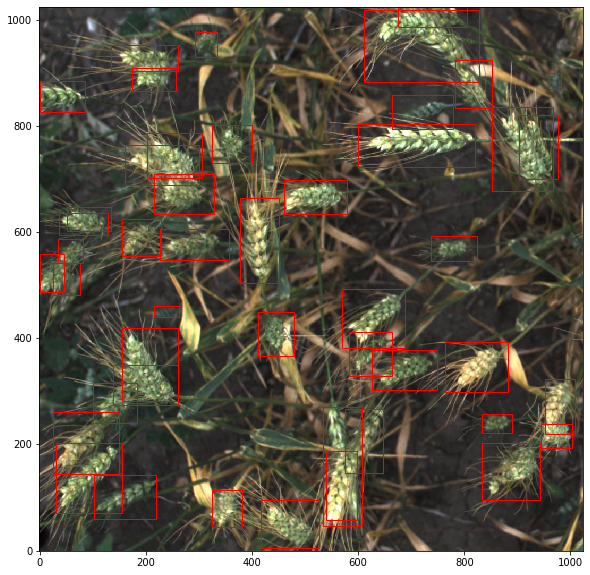

In [19]:
size = 10
sample_id  = list(train_df['image_id'])[0]
img = read_img(f'{data_path}/train/{sample_id}.jpg',target_size)
boxes = train_df[train_df.image_id == sample_id ][['x', 'y', 'w', 'h']].values
scale = train_df[train_df.image_id == sample_id ][['x_scale','y_scale']].values

fig,ax = plt.subplots(1,figsize = (size,size))

ax.imshow(img,origin='lower')

for box,scale in zip(boxes,scale):
    x,y,w,h = box
    x_scale,y_scale=scale
    #print(cx,cy,w,h)
    rect = patches.Rectangle((x,y),w,h,linewidth=1,edgecolor='r',facecolor='none')
    ax.add_patch(rect)


print(sample_id)   

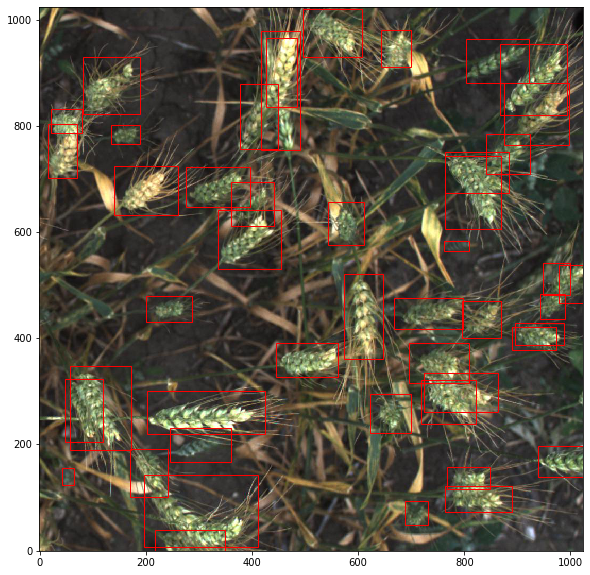

In [20]:
size = 10
sample_id  = list(train_df['image_id'])[0]
img = read_img(f'{data_path}/train/{sample_id}.jpg',target_size)
boxes = train_df[train_df.image_id == sample_id ][['x', 'y', 'w', 'h']].values
scale = train_df[train_df.image_id == sample_id ][['x_scale','y_scale']].values

fig,ax = plt.subplots(1,figsize = (size,size))

img,new_boxes = random_rotation(img,boxes)

ax.imshow(img,origin='lower')

for box,scale in zip(new_boxes,scale):
    x,y,w,h = box
    x_scale,y_scale=scale
    #print(cx,cy,w,h)
    rect = patches.Rectangle((x,y),w,h,linewidth=1,edgecolor='r',facecolor='none')
    ax.add_patch(rect)

#print(sample_id)   

In [21]:
image_ids = train_df['image_id'].unique()
valid_ids = image_ids[:4]
train_ids = image_ids[4:]

In [22]:
valid_df = train_df[train_df['image_id'].isin(valid_ids)]
train_df = train_df[train_df['image_id'].isin(train_ids)]

In [23]:
valid_df.shape, train_df.shape,len(image_ids)

((167, 10), (147626, 10), 3373)

# Data set


In [24]:
image_mean= np.array([0.485, 0.456, 0.406])
image_std = np.array([0.229, 0.224, 0.225])
#pretrained # https://pytorch.org/docs/stable/torchvision/models.html

In [25]:
def image_scale(x,image_mean= np.array([0.485, 0.456, 0.406]),image_std = np.array([0.229, 0.224, 0.225])):
  return (x-image_mean)/image_std
def image_scale_bk(x,image_mean= np.array([0.485, 0.456, 0.406]),image_std = np.array([0.229, 0.224, 0.225])):
  return (x)*image_std+image_mean
  

In [26]:
class WheatDataset(Dataset):

    def __init__(self, dataframe, image_dir, transforms=None, test=False):
        super().__init__()

        self.image_ids = dataframe['image_id'].unique()
        self.df = dataframe
        self.image_dir = image_dir
        self.transforms = transforms
        self.istest = test


    def __len__(self):
        return self.image_ids.shape[0]

    def __getitem__(self, index):
        
        image_id = self.image_ids[index]

        if(self.istest==False):
            image =  read_img(f'{self.image_dir}/train/{image_id}.jpg',target_size)
        elif(self.istest):
            image =  read_img(f'{self.image_dir}/test/{image_id}.jpg',target_size)
        
        
        image = image/255.0
        image = image_scale(image)
        
        
        if(self.istest):
            image = image.transpose((2, 0, 1))
            image = torch.from_numpy(image).float()
            image = torch.as_tensor(image, dtype=torch.float32)
            #sample = {
            #    'image': image,
            #}
            #sample = self.transforms(**sample)
            #image = sample['image']
            
            return image,image_id  
        
        records = self.df[self.df['image_id'] == image_id]   
        boxes = records[['x', 'y', 'w', 'h']].values
        image,boxes = random_rotation(image,boxes)

        image = image.transpose((2, 0, 1))
        image = torch.from_numpy(image).float()
        image = torch.as_tensor(image, dtype=torch.float32)
        
        boxes[:, 2] = boxes[:, 0] + boxes[:, 2]
        boxes[:, 3] = boxes[:, 1] + boxes[:, 3]
        #boxes /= rescale_factor 
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        area = torch.as_tensor(area, dtype=torch.float32)

        # there is only one class
        labels = torch.ones((records.shape[0],), dtype=torch.int64)
        
        
        
        target = {}
        target['boxes'] = boxes
        target['labels'] = labels
        target['image_id'] = torch.tensor([index])
        #target['area'] = area
        
        #if self.transforms:
        #    sample = {
        #        'image': image,
        #        'bboxes': target['boxes'],
        #        'labels': labels
        #    }
        #    sample = self.transforms(**sample)
        #    image = sample['image']
        

        return image, target,image_id  

In [27]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [28]:
train_dataset = WheatDataset(train_df, data_path)
valid_dataset = WheatDataset(valid_df, data_path)


train_loader = DataLoader(
    train_dataset,
    batch_size=4,
    shuffle=True,
    collate_fn=collate_fn
)

valid_loader = DataLoader(
    valid_dataset,
    batch_size=2,
    shuffle=True,
    collate_fn=collate_fn
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


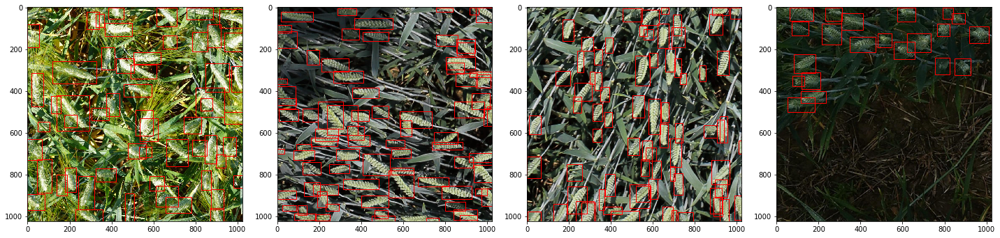

In [29]:
image,target,img_id = next(iter(train_loader))
#print(img)
size = 20
fig,ax = plt.subplots(1,4,figsize = (size,size))
for j in range(4):


  img = image[j].cpu().numpy().transpose((1,2,0)) 
  #img *= image_std
  #img += image_mean

  #size = 10
  #print(target[0]['boxes'])

  for box in target[j]['boxes']:
      x,y,w,h = box.cpu().numpy()
      #print(cx,cy,w,h,x_scale,y_scale)
      rect = patches.Rectangle((x,y),w-x,h-y,linewidth=1,edgecolor='r',facecolor='none')
      ax[j].add_patch(rect)
  ax[j].imshow(image_scale_bk(img))
plt.tight_layout()

(0, 200)

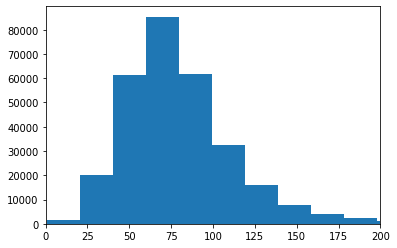

In [30]:
edges = list(train_df['w'])+list(train_df['h'])
plt.hist(edges,bins=50)
plt.xlim([0,200])

(array([   95.,    36.,    20.,   130.,   400.,   848.,  1465.,  2213.,
         3073.,  3987.,  4925.,  5788.,  6606.,  7413.,  8022.,  8689.,
         9378.,  9907., 10359., 10666., 10854., 11660., 11265., 11505.,
        10658., 11057.,  9938.,  9373.,  8599.,  7740.,  7117.,  6586.,
         6543.,  5093.,  5168.,  4751.,  4573.,  3956.,  3729.,  3376.,
         3124.,  2987.,  2805.,  2466.,  2266.,  2137.,  2063.,  1831.,
         1886.,  1532.,  1540.,  1412.,  1225.,  1304.,  1168.,  1118.,
          995.,   947.,   813.,   847.,   780.,   721.,   640.,   592.,
          568.,   642.,   456.,   473.,   460.,   415.,   440.,   404.,
          349.,   285.,   323.,   312.,   266.,   276.,   231.,   222.,
          211.,   214.,   208.,   208.,   165.,   154.,   135.,   148.,
          119.,   141.,   113.,   118.,   117.,    83.,    99.,    99.,
           84.,   104.,   128.]),
 array([0.        , 0.04040404, 0.08080808, 0.12121212, 0.16161616,
        0.2020202 , 0.24242424, 0.

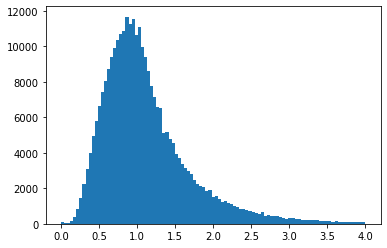

In [31]:
ratio = np.asarray(train_df['w'])/np.asarray(train_df['h'])
ratio = np.hstack([ratio,1.0/ratio])
plt.hist(ratio ,bins=np.linspace(0,4,100))
#plt.xlim([0,10])

(array([ 22.,  24.,  18.,  44.,  43.,  72.,  98.,  87., 105., 119., 161.,
         82., 117., 169., 129., 110., 161., 110., 103., 112., 156., 105.,
        107., 152., 102.,  86., 142.,  89.,  63.,  68.,  88.,  55.,  54.,
         68.,  34.,  38.,  26.,  15.,  13.,   5.,   8.,   5.,   0.,   1.,
          1.,   0.,   1.,   0.,   0.,   1.]),
 array([  1. ,   3.3,   5.6,   7.9,  10.2,  12.5,  14.8,  17.1,  19.4,
         21.7,  24. ,  26.3,  28.6,  30.9,  33.2,  35.5,  37.8,  40.1,
         42.4,  44.7,  47. ,  49.3,  51.6,  53.9,  56.2,  58.5,  60.8,
         63.1,  65.4,  67.7,  70. ,  72.3,  74.6,  76.9,  79.2,  81.5,
         83.8,  86.1,  88.4,  90.7,  93. ,  95.3,  97.6,  99.9, 102.2,
        104.5, 106.8, 109.1, 111.4, 113.7, 116. ]),
 <a list of 50 Patch objects>)

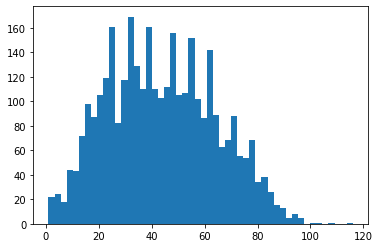

In [32]:
import collections
num_boxs= collections.Counter(train_df['image_id'])
plt.hist(num_boxs.values(),bins=50)

## Anchors

In [33]:
def gen_anchors(sub_sample = 16):
  ratios = np.asarray([0.5, 1.0/1.5, 1.0, 1.5, 2])
  anchor_scales = np.asarray([  8., 16., 24.])
  nbox = len(ratios)*len(anchor_scales)

  fe_size = (target_size//sub_sample)
  ctr_xs = np.arange(sub_sample, (fe_size+1) * sub_sample, sub_sample) - sub_sample/2
  ctr_ys = np.arange(sub_sample, (fe_size+1) * sub_sample, sub_sample) - sub_sample/2

  anchors = np.zeros((fe_size * fe_size * nbox, 4))
  index = 0
  for ctr_x in ctr_xs:
    for ctr_y in ctr_ys:
      for i in range(len(ratios)):
        for j in range(len(anchor_scales)):
          h = sub_sample * anchor_scales[j] * np.sqrt(ratios[i])
          w = sub_sample * anchor_scales[j] * np.sqrt(1./ ratios[i])
          anchors[index, 0] = ctr_x - w / 2.
          anchors[index, 1] = ctr_y - h / 2.
          anchors[index, 2] = ctr_x + w / 2.
          anchors[index, 3] = ctr_y + h / 2.
          index += 1
  anchors  = torch.from_numpy(anchors).float().to(device)
  return anchors,nbox


## loc<->bbox

In [34]:
def loc2bbox(anchors, locs):
    # Converting anchors and predicted location deltas to "actual" bounding-boxes.
    w = anchors[:, 2] - anchors[:, 0]
    h = anchors[:, 3] - anchors[:, 1]
    ctr_x = anchors[:, 0] + 0.5 * w
    ctr_y = anchors[:, 1] + 0.5 * h
    
    dx = locs[:, 0]
    dy = locs[:, 1]
    dw = locs[:, 2]
    dh = locs[:, 3]
    
    #print(anchors.shape,locs.shape)

    ctr_y = dy * h + ctr_y
    ctr_x = dx * w + ctr_x
    h = torch.exp(dh) * h
    w = torch.exp(dw) * w

    bbox = torch.zeros_like(locs)
    bbox[:, 0] = ctr_x - 0.5 * w
    bbox[:, 1] = ctr_y - 0.5 * h
    bbox[:, 2] = ctr_x + 0.5 * w
    bbox[:, 3] = ctr_y + 0.5 * h
    return bbox


def bbox2loc(src_bbox, dst_bbox, eps=np.finfo('float32').eps):
    eps = torch.tensor(eps).float().to(device)

    width = torch.max(src_bbox[:, 2] - src_bbox[:, 0],eps)
    height = torch.max(src_bbox[:, 3] - src_bbox[:, 1],eps)
    ctr_x = src_bbox[:, 0] + 0.5 * width
    ctr_y = src_bbox[:, 1] + 0.5 * height

    base_width = dst_bbox[:, 2] - dst_bbox[:, 0]
    base_height = dst_bbox[:, 3] - dst_bbox[:, 1]
    base_ctr_x = dst_bbox[:, 0] + 0.5 * base_width
    base_ctr_y = dst_bbox[:, 1] + 0.5 * base_height

    height = torch.max(height, eps)
    width = torch.max(width, eps)

    dy = (base_ctr_y - ctr_y) / height
    dx = (base_ctr_x - ctr_x) / width
    dh = torch.log(base_height / height)
    dw = torch.log(base_width / width) 

    locs = torch.stack((dx, dy, dw, dh), dim=1)
    return locs


def random_choice(arr, size):
    idx = torch.randperm(len(arr), device=device)
    return arr[idx][0:size]


def normal_init(module, mean, stddev):
    module.weight.data.normal_(mean, stddev)
    module.bias.data.zero_()

## iou

In [35]:
def intersect(box_a, box_b):
    # Coverting (cx, cy, w, h) to (x1, y1, x2, y2) since its easier to extract min/max coordinates
    #temp_box_a, temp_box_b = center_2_hw(box_a), center_2_hw(box_b)
    
    max_x = torch.min(box_a[:, None, 2], box_b[ None,:, 2])
    max_y = torch.min(box_a[:, None, 3], box_b[ None,:, 3])
    min_x = torch.max(box_a[:, None, 0], box_b[ None,:, 0])
    min_y = torch.max(box_a[:, None, 1], box_b[ None,:, 1])
    
    return torch.clamp(max_x-min_x,min=0)*torch.clamp(max_y-min_y,min=0)

def container(box_a, box_b):
    # Coverting (cx, cy, w, h) to (x1, y1, x2, y2) since its easier to extract min/max coordinates
    #temp_box_a, temp_box_b = center_2_hw(box_a), center_2_hw(box_b)
    
    max_x = torch.max(box_a[:, None, 2], box_b[ None,:, 2])
    max_y = torch.max(box_a[:, None, 3], box_b[ None,:, 3])
    min_x = torch.min(box_a[:, None, 0], box_b[ None,:, 0])
    min_y = torch.min(box_a[:, None, 1], box_b[ None,:, 1])
    
    return (max_x-min_x)*(max_y-min_y)

def box_area(box):
    return (box[:,2]-box[:,0]) * (box[:,3]-box[:,1])

#https://ieeexplore.ieee.org/abstract/document/8786135
#improment iou : iou ,  container = minimun box contain a and b 

def cal_iou(box_a, box_b):
    
    intersection = intersect(box_a, box_b)
    container_area = container(box_a, box_b)
    union = box_area(box_a).unsqueeze(1) + box_area(box_b).unsqueeze(0) - intersection

    return intersection / union - (container_area-union)/container_area

In [36]:
#tmp = cal_iou(torch.tensor([[0,0,1,1]]).float(),torch.tensor([[0,0,1,1],[-0.5,0,2,2]]).float())
#tmp

# Models

In [37]:
class ProposalLayer(nn.Module):
    def __init__(self, img_size, nms_thresh=0.5, n_train_pre_nms=12000, n_train_post_nms=2000,
                 n_test_pre_nms=12000, n_test_post_nms=2000, min_size=16):

        super().__init__()
        self.img_size = img_size
        self.nms_threshold = nms_thresh
        self.n_train_pre_nms = n_train_pre_nms
        self.n_train_post_nms = n_train_post_nms
        self.n_test_pre_nms = n_test_pre_nms
        self.n_test_post_nms = n_test_post_nms
        self.min_size = min_size

    def forward(self, locs, scores, anchors):
        if self.training:
            n_pre_nms = self.n_train_pre_nms
            n_post_nms = self.n_train_post_nms
        else:
            n_pre_nms = self.n_test_pre_nms
            n_post_nms = self.n_test_post_nms

        roi = loc2bbox(anchors, locs)
        roi = torch.clamp(roi, 0, self.img_size)

        # Remove predicted boxes with either height or width < threshold.
        widths = roi[:, 2] - roi[:, 0]
        heights = roi[:, 3] - roi[:, 1]
        keep = torch.where((heights >= self.min_size) & (widths >= self.min_size))[0]

        roi = roi[keep, :]
        scores = scores[keep]

        # Sort all (proposal, score) pairs by score from highest to lowest and the the n_pre_nms highest.        
        indicies = torch.argsort(scores, descending=True)        
        indicies = indicies[:n_pre_nms]
        roi = roi[indicies, :]
        scores = scores[indicies]

        keep = nms(roi, scores, self.nms_threshold) #nms = non-max suppression 
        keep = keep[:n_post_nms]
        roi = roi[keep]

        return roi

In [38]:
class RegionProposalNetwork(nn.Module):
    def __init__(self, img_size, in_channels=1024, mid_channels=1024):
        super().__init__()

        # Note: all images in the forward pass need to be of shape 3 x img_size x img_size
        self.img_size = img_size
        self.anchors,self.num_base_anchors = gen_anchors()
        
        self.proposal_layer = ProposalLayer(img_size)

        self.conv = nn.Conv2d(in_channels, mid_channels, kernel_size=3, stride=1, padding=1)
        #self.score = nn.Conv2d(mid_channels, 2 * self.num_base_anchors, kernel_size=1, stride=1, padding=0)
        self.score = nn.Conv2d(mid_channels, 2 * self.num_base_anchors, kernel_size=1, stride=1, padding=0)
        self.loc = nn.Conv2d(mid_channels, 4 * self.num_base_anchors, kernel_size=1, stride=1, padding=0)
        
        normal_init(self.conv, 0.0, 0.01)
        normal_init(self.score, 0.0, 0.01)
        normal_init(self.loc, 0.0, 0.01)
        

    def forward(self, x):        
        n, _, height, width = x.shape
        #print(x.shape)        
        h = F.relu(self.conv(x))
        #print("nope")        
        
        #print(h.shape)
        rpn_locs = self.loc(h)
        #print(rpn_locs.shape)
        rpn_locs = rpn_locs.permute(0, 2, 3, 1).contiguous().view(n, -1, 4)

        rpn_scores = self.score(h)
        #rpn_scores = self.linear(self.score(h))
        #print(rpn_scores.shape)
        
        rpn_scores = rpn_scores.permute(0, 2, 3, 1).contiguous()

        #rpn_softmax_scores = F.softmax(rpn_scores.view(n, height, width, self.num_base_anchors, 2), dim=4)
        rpn_softmax_scores = torch.sigmoid(rpn_scores.view(n, height, width, self.num_base_anchors, 2)) # binary anyway

        #rpn_fg_scores = rpn_softmax_scores[:, :, :, :, 1].contiguous()
        rpn_fg_scores = rpn_softmax_scores[:, :, :, :, 1].contiguous()
        rpn_fg_scores = rpn_fg_scores.view(n, -1)
        rpn_scores = rpn_scores.view(n, -1, 2)

        rois = []
        roi_indices = []
        for i in range(n):
            roi = self.proposal_layer(rpn_locs[i], rpn_fg_scores[i], self.anchors)
            batch_index = i * torch.ones((len(roi),)).int()
            rois.append(roi)
            roi_indices.append(batch_index)

        rois = torch.cat(rois, dim=0).to(device)
        roi_indices = torch.cat(roi_indices, dim=0).to(device)
        return rpn_locs, rpn_scores, rois, roi_indices, self.anchors

In [39]:
class RoIHead(nn.Module):
    def __init__(self, num_classes, output_size, num_hidden=1024, in_channels=1024, sub_sample=16):
        super().__init__()

        self.linear = nn.Linear(output_size[0] * output_size[0] * in_channels, num_hidden)
        self.cls_loc = nn.Linear(num_hidden, 4 * num_classes)
        self.score = nn.Linear(num_hidden, num_classes)
        self.roi_pool = RoIPool(output_size, spatial_scale=1.0/sub_sample)
        print(output_size)
        self.roi_align = RoIAlign(output_size, spatial_scale=1.0/sub_sample,sampling_ratio = 3)
        
        normal_init(self.cls_loc, 0, 0.001)
        normal_init(self.score, 0, 0.01)

    def forward(self, x, rois, roi_indices):
        indicies_and_rois = torch.cat([
            roi_indices.float().unsqueeze(-1),
            rois
        ], dim=1)
        #print(indicies_and_rois)
        pool_vals = self.roi_align(x, indicies_and_rois)
        #print(pool_vals.shape)

        pool_vals = pool_vals.view(pool_vals.size(0), -1)
        
        
        h = F.relu(self.linear(pool_vals))
        #h = self.linear(pool_vals)
        roi_cls_locs = self.cls_loc(h)
        roi_scores = self.score(h)
        return roi_cls_locs, roi_scores

In [40]:
class FasterRCNN(nn.Module):
    def __init__(self,backbone, img_size, num_classes, output_size=7):
        super().__init__()
        
        self.img_size = img_size
        self.num_classes = num_classes
        self.backbone = backbone
        self.region_proposal_network = RegionProposalNetwork(img_size)
        self.roi_head = RoIHead(num_classes, [output_size,output_size])
        
    """
    def change_freezing(self, mode=False):
        for param in self.backbone.parameters():
            param.requires_grad = mode

    """
    def train(self, mode=True):
        super().train(mode)

        # Avoid updating BN stats
        #for m in self.backbone.modules():
        #    if isinstance(m, nn.BatchNorm2d):
        #        m.eval()
    
    def forward_rpn(self, x):
        feature_map = self.backbone(x)
        rpn_locs, rpn_scores, rois, roi_indices, _ = self.region_proposal_network(feature_map)
        return rpn_locs, rpn_scores, rois, roi_indices, feature_map

    def forward_roi(self, x, rois, roi_indices):
        #print(x.shape, rois.shape, roi_indices.shape)
        #print("forward_roi")
        roi_cls_locs, roi_scores = self.roi_head(x, rois, roi_indices)
        #print("done")
        return roi_cls_locs, roi_scores
    
    def predict(self, x):
        # Forward for inference
        # Currently only support batch_size=1
        assert len(x.shape) == 4 and x.shape[0] == 1

        rpn_locs, rpn_scores, rois, roi_indices, feature_map = self.forward_rpn(x)
        roi_cls_locs, roi_scores = self.forward_roi(feature_map, rois, roi_indices)

        roi_cls_locs = roi_cls_locs.view(-1, self.num_classes, 4)
        rois = rois.view(-1, 1, 4).expand_as(roi_cls_locs)

        cls_boxes = loc2bbox(rois.reshape(-1, 4), roi_cls_locs.reshape(-1, 4))
        cls_boxes = cls_boxes.view(-1, self.num_classes * 4)
        cls_boxes[:, 0::2] = torch.clamp(cls_boxes[:, 0::2], min=0, max=self.img_size)
        cls_boxes[:, 1::2] = torch.clamp(cls_boxes[:, 1::2], min=0, max=self.img_size)

        cls_boxes =  cls_boxes.view(-1,  self.num_classes, 4)        
        roi_scores = F.softmax(roi_scores, dim=1)

        return roi_scores, cls_boxes

In [41]:
def sample_labels(labels, n_sample=512, pos_ratio=0.5):
    n_pos = pos_ratio * n_sample

    pos_index = torch.where(labels == 1)[0]
    if len(pos_index) > n_pos:
        disable_index = random_choice(pos_index, size=int(len(pos_index) - n_pos))
        labels[disable_index] = -1

    #n_neg = n_sample - torch.sum(labels == 1)
    n_neg = max(torch.sum(labels == 1),1)
    neg_index = torch.where(labels == 0)[0]
    if len(neg_index) > n_neg:
        disable_index = random_choice(neg_index, size=int(len(neg_index) - n_neg))
        labels[disable_index] = -1

    return labels


def create_anchor_labels(anchors, gt, img_size, pos_iou_threshold=0.6, neg_iou_threshold=0.15,
                         n_sample=512, pos_ratio=0.5):
    index_inside = torch.where((anchors[:, 0] >= 0) &
                               (anchors[:, 1] >= 0) &
                               (anchors[:, 2] <= img_size) &
                               (anchors[:, 3] <= img_size))[0]
    #print(index_inside)
    labels = -1 * torch.ones((len(index_inside), )).int()
    valid_anchor_boxes = anchors[index_inside.cpu()]

    ious = cal_iou(valid_anchor_boxes, gt)
    #print(ious.shape,valid_anchor_boxes.shape,gt.shape)

    argmax_ious = ious.argmax(dim=1)
    #print(argmax_ious.shape,argmax_ious)
    max_ious = ious[torch.arange(len(index_inside)), argmax_ious]
    
    gt_argmax_ious = ious.argmax(dim=0)
    
    gt_max_ious = ious[gt_argmax_ious, torch.arange(ious.shape[1])]
    gt_argmax_ious = torch.where(ious == gt_max_ious)[0]
    
    labels[max_ious < neg_iou_threshold] = 0
    labels[gt_argmax_ious] = 1
    labels[max_ious >= pos_iou_threshold] = 1    
    
    labels = sample_labels(labels, n_sample, pos_ratio)
    
    locs = bbox2loc(valid_anchor_boxes, gt[argmax_ious])

    anchor_labels = -1 * torch.ones((len(anchors),)).int()
    anchor_labels[index_inside] = labels
    anchor_labels = anchor_labels.long().to(device)

    anchor_locations = torch.zeros_like(anchors)
    anchor_locations[index_inside, :] = locs
    anchor_locations = anchor_locations.to(device)
    
    return anchor_labels, anchor_locations


def create_target_labels(rois, gt_boxes, label):
    n_sample = 512
    pos_ratio = 0.5
    pos_iou_thresh = 0.5
    neg_iou_thresh_hi = 0.15
    neg_iou_thresh_lo = -1.0
    loc_normalize_mean = torch.tensor([0.0, 0.0, 0.0, 0.0]).view((1, 4)).float().to(device)
    loc_normalize_std = torch.tensor([0.1, 0.1, 0.2, 0.2]).view((1, 4)).float().to(device)

    # Rois comes from the network, we need to disable the grad tracing,
    # since we do some ops which are not differentiable
    with torch.no_grad():          
        pos_roi_per_image = np.round(n_sample * pos_ratio)
        # rois = torch.cat((rois, gt_boxes), dim=0)
        iou = cal_iou(rois, gt_boxes)

        gt_assignment = iou.argmax(dim=1)
        max_iou = iou.max(axis=1)[0]
        
        gt_roi_label = label[gt_assignment]

        pos_index = torch.where(max_iou >= pos_iou_thresh)[0]
        pos_roi_per_this_image = int(min(pos_roi_per_image, len(pos_index)))

        if len(pos_index) > 0:
            pos_index = random_choice(pos_index, pos_roi_per_this_image)

        neg_index = torch.where((max_iou < neg_iou_thresh_hi) & (max_iou >= neg_iou_thresh_lo))[0]
        neg_roi_per_this_image = n_sample - pos_roi_per_this_image
        neg_roi_per_this_image = int(min(neg_roi_per_this_image, len(neg_index)))

        if len(neg_index) > 0:
            neg_index = random_choice(neg_index, neg_roi_per_this_image)

        keep_index = torch.cat([pos_index, neg_index], dim=0)
        #print(keep_index.shape)
        gt_roi_label = gt_roi_label[keep_index]
        gt_roi_label[pos_roi_per_this_image:] = 0  # negative labels becomes background
        sample_roi = rois[keep_index]

        gt_roi_loc = bbox2loc(sample_roi, gt_boxes[gt_assignment[keep_index]])
        #gt_roi_loc = (gt_roi_loc - loc_normalize_mean) / loc_normalize_std
    return sample_roi, gt_roi_loc, gt_roi_label

In [42]:
'test create_anchor_labels'
"""
image,target,img_id = next(iter(train_loader))
img_size = image[0].shape[1]
gt = target[0]['boxes'].to(device)

anchors = gen_anchors()[0]

anchor_labels, anchor_locations = create_anchor_labels(anchors, gt, img_size)
#anchor_labels, anchor_locations
print(anchors.shape,anchor_labels.shape,anchor_locations.shape)
size = 10
fig,ax = plt.subplots(figsize = (size,size))
plt.imshow(image[0].permute(1,2,0))
anchor_locations = loc2bbox(anchors,anchor_locations)
for label,loc in zip(anchor_labels.cpu().numpy(), anchor_locations.cpu().numpy()):
  if(label == 1):
    x,y,w,h = loc
    #print(loc)
    rect = patches.Rectangle((x,y),w-x,h-y,linewidth=1,edgecolor='r',facecolor='none')
    ax.add_patch(rect)
"""
print()


In [43]:

#if(pretrained_dir!=''):
#    pretrained_model  = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False,pretrained_backbone=False)
#    pretrained_model.load_state_dict(torch.load(pretrained_dir))
#else:

#backbone = torchvision.models.resnet18(pretrained=True)
    
#model =  pretrained_model

backbone =torchvision.models.resnet50(pretrained=True)
fe = list(backbone.children())
k = torch.ones(1,3,target_size,target_size).float()
req_features = []
for n,i in enumerate(fe):
    #print(n,i)
    k = i(k)
    req_features.append(i)
    out_channels = k.size()[1]
    #print("feature size: ",k.size()[2])
    if k.size()[2] <= 64:
        print("final_img_size:",k.size()[2])
        print("out_channels:",out_channels)
        
        break

faster_rcnn_fe_extractor = nn.Sequential(*req_features)
sub_sample= 16

final_img_size: 64
out_channels: 1024


In [44]:
#ist(backbone.children())[0][0]

In [45]:
model = FasterRCNN(faster_rcnn_fe_extractor, target_size, 1 + 1) # 1 class for background
model = model.to(device)

[7, 7]


In [46]:
rpn_lambda = 10./3
roi_lambda = 10./3

params = [p for p in model.parameters() if p.requires_grad]
#optimizer = torch.optim.AdamW(params, lr=0.001)

optimizer = torch.optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=0.001)
#optimizer = torch.optim.AdamW(params, lr=0.01)

In [47]:

def filter_smooth_l1(target, pred, labels, ignore_idx=-1):
    filter_target = target[labels != ignore_idx, :]
    filter_pred = pred[labels != ignore_idx, :]
    loss = F.smooth_l1_loss(filter_target, filter_pred, reduction="none")
    return torch.sum(loss) / len(filter_target)

In [48]:
model.train()
itr = 0
epoch=0
start = time.time()
if(device== torch.device('cpu')):
  max_time = 0
if(device== torch.device('cuda')):
  max_time = 7200 #not really enough 
print("max_time=",max_time)    
idx = 0

while(time.time()-start<max_time):
    train_loss = 0.0
    for images, targets, image_ids in train_loader:
        #if(time.time()-start>max_time):
        #    break     
        model.zero_grad()
        images = torch.stack(images,dim=0).to(device)
        
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets] # targets or gt -> fround truth

        rpn_locs, rpn_scores, rois, roi_indices, feature_map = model.forward_rpn(images)

        rpn_cls_loss, rpn_loc_loss = 0.0, 0.0
        roi_cls_loss, roi_loc_loss = 0.0, 0.0
        for i in range(len(images)):
            
            gt_i = targets[i]['boxes'].to(device)
            cl_i =  targets[i]['labels'].to(device)
            rois_i = rois[roi_indices == i]
            
            #print(rois_i)
            
            # RPN loss
            anchors,_ = gen_anchors()
            anchor_labels, anchor_locations = create_anchor_labels(anchors, gt_i, target_size)
            #print(anchor_labels[anchor_labels==1].shape,anchor_labels[anchor_labels==0].shape)
            len_rpn = anchor_labels[anchor_labels==1].shape[0]+anchor_labels[anchor_labels==0].shape[0]
            #labels, valid_anchor_boxes, argmax_ious, index_inside = create_anchor_labels(anchors, gt_i, target_size)
            # labels = sample_labels(labels)
            #locs = bbox2loc(valid_anchor_boxes, gt_i[argmax_ious])

            #anchor_labels = -1 * torch.ones((len(anchors),)).int()
            #anchor_labels[index_inside] = labels
            #anchor_labels = anchor_labels.long().to(device)

            #anchor_locations = torch.zeros_like(anchors)
            #anchor_locations[index_inside, :] = locs
            #anchor_locations = anchor_locations.to(device)

            rpn_cls_loss += F.cross_entropy(rpn_scores[i, :, :], anchor_labels, ignore_index = -1)

            temp_loss = F.smooth_l1_loss(anchor_locations, rpn_locs[i, :, :], reduction="none")
            label_filter = (anchor_labels > 0).float().unsqueeze(-1)
            temp_loss = temp_loss * label_filter
            rpn_loc_loss += torch.sum(temp_loss) / max(torch.sum(label_filter), 1)

            # ROI loss
            sample_roi, gt_roi_loc, gt_roi_label = create_target_labels(rois_i, gt_i, cl_i)            
            
            sample_roi_index = torch.zeros(len(sample_roi)).to(device)
            #print("here")
            roi_cls_loc, roi_score = model.forward_roi(
                feature_map[i, :, :, :].unsqueeze(0),
                sample_roi,
                sample_roi_index)
            #print("here")

            #print(gt_roi_label.shape,gt_roi_label[gt_roi_label==1].shape,gt_roi_label[gt_roi_label==0].shape)
            pos_len = len(gt_roi_label[gt_roi_label==1])
            neg_len = len(gt_roi_label[gt_roi_label==0])
            cut = max(min(pos_len*2,pos_len+neg_len),1)
            #print(cut)
            roi_cls_loss += F.cross_entropy(roi_score[:cut,:], gt_roi_label[:cut])#*len_rpn/cut

            n_sample = roi_cls_loc.shape[0]
            roi_loc = roi_cls_loc.view(n_sample, -1, 4)
            
            #print(roi_loc.shape)
            #print(gt_roi_label)
            #print(torch.arange(0, n_sample).long().shape)
            
            roi_loc = roi_loc[torch.arange(0, n_sample).long()[:cut], gt_roi_label[:cut]]

            #print(gt_roi_label)
            #torch.Size([128, 4])
            #print(roi_loc.shape)
            #print(gt_roi_loc.shape)

            temp_roi_loss = F.smooth_l1_loss(roi_loc, gt_roi_loc[:cut,:], reduction="none")#*len_rpn/cut
            roi_label_filter = (gt_roi_label[:cut] > 0).float().unsqueeze(-1)
            temp_roi_loss = temp_roi_loss * roi_label_filter            
            roi_loc_loss += torch.sum(temp_roi_loss) / max(torch.sum(roi_label_filter), 1)
            
            if(idx % 50 == 0):
              print(len_rpn,cut,len(gt_i))
              print(idx,rpn_cls_loss.data.cpu().numpy(),rpn_lambda *rpn_loc_loss.data.cpu().numpy(),roi_cls_loss.data.cpu().numpy(),roi_lambda *roi_loc_loss.data.cpu().numpy())

            idx+=1
        

        rpn_loss = rpn_cls_loss  + rpn_lambda * rpn_loc_loss
        roi_loss = roi_cls_loss + roi_lambda * roi_loc_loss

        batch_loss = (rpn_loss + roi_loss) / len(images)
        batch_loss.backward()
        optimizer.step()
              
        train_loss += batch_loss.detach().cpu().numpy()
        
            
    train_loss = np.round(train_loss / len(train_loader), 6)
    print(f"Train loss: {train_loss}")

max_time= 7200
512 1 49
0 0.6957158 2.928354342778524 0.6927747 0.0
512 106 55
50 1.9859983 1.1039785544077556 2.0091205 1.0713193813959758
116 28 11
100 0.6564674 0.23811747630437216 0.61728823 0.2729267130295436
512 104 53
150 1.7097136 1.0596436262130737 1.0383556 0.8078845342000326
254 22 13
200 0.5989242 0.4804522295792898 0.10530229 0.10664756099383037
434 54 32
250 1.5737064 1.19736115137736 0.62095714 0.6844626367092133
512 92 56
300 0.5146344 0.7883203526337942 0.16707188 0.17347527046998343
512 80 49
350 1.4823296 1.3808253407478333 0.42187816 0.6179917355378469
512 52 82
400 0.4683655 0.8240092794100444 0.11557352 0.14066575715939206
512 86 83
450 1.4827048 1.891944408416748 0.2584447 0.38142576813697815
512 102 64
500 0.47785825 0.4865204294522604 0.22487281 0.15909355133771896
512 92 41
550 1.4106913 1.2048609058062236 0.24376172 0.37852369248867035
512 88 53
600 0.49588785 0.4420092701911926 0.06638504 0.14763628443082175
512 82 65
650 1.4360604 1.443560322125753 0.372753

444 66 34
5500 1.7960103 1.7162672678629558 0.6089624 0.4347588121891022
512 104 74
5550 0.9321062 0.692131519317627 0.17949256 0.14714236060778302
512 46 64
5600 1.6742162 2.47038205464681 0.15954036 0.40208250284194946
52 26 7
5650 1.3069272 0.5348228414853414 0.08965714 0.21138258278369904
170 28 11
5700 1.9001789 1.5521106123924255 0.34663743 0.5031718313694
512 118 73
5750 0.74777746 0.9704208374023438 0.08435341 0.16199253499507904
512 66 35
5800 1.7707088 1.8592570225397747 0.48466706 0.45674910147984826
512 78 38
5850 0.8620528 0.9294206897417705 0.122048154 0.2069170524676641
512 116 61
5900 1.6776209 1.5571450193723044 0.19397187 0.3820455571015676
512 66 60
5950 0.795701 0.7653288543224335 0.05809731 0.12265520791212718
512 90 60
6000 2.3272521 1.9635993242263794 0.32423338 0.47539860010147095
508 58 34
6050 1.0085236 0.6897751986980438 0.11373575 0.17923651883999508
512 148 75
6100 1.5923915 1.2409395972887676 0.1533368 0.30047441522280377
512 70 53
6150 1.0446842 0.6167689

512 150 81
10950 1.6789185 1.348106066385905 0.08028926 0.28522824247678125
512 90 46
11000 0.83017117 0.6674261887868246 0.055530306 0.136166512966156
512 54 51
11050 1.7438508 1.595707138379415 0.19134006 0.31878481308619183
512 104 75
11100 0.7742594 1.204915742079417 0.13500905 0.1547736426194509
512 126 54
11150 1.5932322 1.2914767861366272 0.106923 0.2698041250308355
512 96 55
11200 0.8072421 0.8418585856755575 0.056245696 0.10125649472077689
486 28 29
11250 1.8185742 1.6579854488372803 0.25853547 0.3823539366324743
412 48 25
11300 1.1003007 1.4069335659344993 0.27069697 0.1741093024611473
512 88 71
11350 1.7360317 1.7741286754608154 0.21782413 0.22790590922037762
512 66 55
11400 0.84388995 0.8192704617977142 0.06985481 0.10728634893894196
222 42 20
11450 1.8724718 1.4917872349421184 0.60202163 0.39736072222391766
512 134 61
11500 0.82192266 0.37344709038734436 0.13976695 0.14776209990183514
102 4 3
11550 1.6640699 1.7749770482381186 0.29658955 0.39554009834925336
512 110 44
1160

In [49]:
def gen_predict(img, iou_threshold = 0.2):

  img = img.to(device)
  model.eval()
  class_hat, bb_hat = model.predict(img.unsqueeze(0))
  
  prob, class_idx = torch.max(class_hat, dim=1)
  
  #print(class_hat)
  
  #class_idx+=1
  #print(prob)
  #print(class_idx)
  prob_threshold = 0.5
  prob = class_hat[:,1]
  class_idx = torch.ones_like(prob).type(torch.LongTensor)
  prob_val, prob_idx = torch.sort(prob, descending=True)
  prob_idx = prob_idx[prob_val>prob_threshold]
  prob_val = prob_val[prob_val>prob_threshold]
  
  #print(class_idx)
  #prob_val, prob_idx = torch.sort(prob, descending=True)
  
  bb_hat = bb_hat[torch.arange(0, len(class_idx)), class_idx, :]

  
  bb_hat = bb_hat[prob_idx, :]
  class_idx = class_idx[prob_idx]

  bb_hat = bb_hat[class_idx != 0, :]
  prob_val = prob_val[class_idx != 0]
  class_idx = class_idx[class_idx != 0]

  keep = nms(bb_hat, prob_val, iou_threshold)

  bb_hat = bb_hat[keep, :].detach().cpu().numpy()
  prob_val = prob_val[keep].detach().cpu().numpy()
  class_idx = class_idx[keep].detach().cpu().numpy()
  return np.hstack([prob_val[:, None],bb_hat])

In [50]:
image,target,img_id = next(iter(valid_loader))
predict = gen_predict(image[0])


In [51]:
predict;

In [52]:
predict = sorted(predict,key=lambda x:x[0],reverse=True)
predict[0:5]

[array([9.9983716e-01, 8.3470497e+01, 9.4481659e+02, 2.2956863e+02,
        1.0218881e+03], dtype=float32),
 array([  0.9998054, 245.58247  , 621.5005   , 346.98447  , 729.124    ],
       dtype=float32),
 array([  0.99973947, 412.56335   ,   7.9156723 , 503.87378   ,
        111.46282   ], dtype=float32),
 array([  0.99963665, 721.4829    , 555.0934    , 790.6907    ,
        684.2689    ], dtype=float32),
 array([  0.99959975, 494.02036   , 682.522     , 580.47327   ,
        812.1594    ], dtype=float32)]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


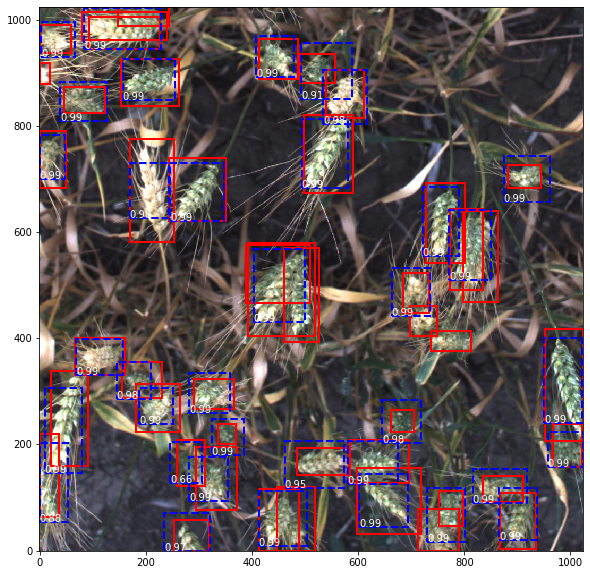

In [53]:
size = 10
fig,ax = plt.subplots(figsize = (size,size))
ax.imshow(image_scale_bk((image[0].permute(1,2,0)).cpu().detach().numpy()),origin='lower')

for box in target[0]['boxes']:
    x1,y1,x2,y2 = box
    rect = patches.Rectangle((x1,y1),x2-x1,y2-y1,linewidth=2,edgecolor='r',facecolor='none')
    #print(x2-x1,y2-y1)
    ax.add_patch(rect)

plt.savefig("scratch.png",format='png')

for box in predict:
    score,x1,y1,x2,y2 = box
    rect = patches.Rectangle((x1,y1),x2-x1,y2-y1,linewidth=2,edgecolor='b',linestyle='--',facecolor='none')
    #print(x2-x1,y2-y1)
    ax.add_patch(rect)
    ax.text(x1,y1,str(score)[:4],c='w')



In [54]:
def format_prediction_string(boxes, scores):
    pred_strings = []
    for j in zip(scores, boxes):
        pred_strings.append("{0:.4f} {1} {2} {3} {4}".format(j[0], j[1][0], j[1][1], j[1][2], j[1][3]))

    return " ".join(pred_strings)



In [55]:
test_dataset = WheatDataset(submit_df, data_path,test=True)


test_data_loader = DataLoader(
    test_dataset,
    batch_size=8,
    shuffle=False,
    collate_fn=collate_fn
)

In [56]:
detection_threshold = 0.5
results = []
model.eval()
for images, image_ids in test_data_loader:

    for i, image in enumerate(images):
        predict = gen_predict(image)
        scores = predict[:,0]
        boxes = predict[:,1:]
        
        image_id = image_ids[i]
        
        boxes[:, 2] = boxes[:, 2] - boxes[:, 0]
        boxes[:, 3] = boxes[:, 3] - boxes[:, 1]
        
        result = {
            'image_id': image_id,
            'PredictionString': format_prediction_string(boxes, scores)
        }

        #print(result)
        results.append(result)

In [57]:
test_df = pd.DataFrame(results, columns=['image_id', 'PredictionString'])
test_df.to_csv(data_path+'/submission.csv', index = False)
test_df

,image_id,PredictionString
0,aac893a91,0.9984 96.83210754394531 620.6459350585938 107...
1,51f1be19e,0.9993 807.1171875 781.2651977539062 94.585693...
2,f5a1f0358,0.9995 607.4874267578125 731.4691162109375 85....
3,796707dd7,0.9994 894.23046875 325.9642639160156 99.29992...
4,51b3e36ab,0.9996 369.4642639160156 162.60888671875 88.38...
5,348a992bb,0.9998 285.5811767578125 339.9230651855469 68....
6,cc3532ff6,0.9998 376.8929443359375 0.0 73.958251953125 9...
7,2fd875eaa,0.9999 434.59808349609375 70.05484008789062 84...
8,cb8d261a3,0.9985 755.7240600585938 721.0763549804688 82....
9,53f253011,0.9998 235.9775848388672 844.760986328125 101....


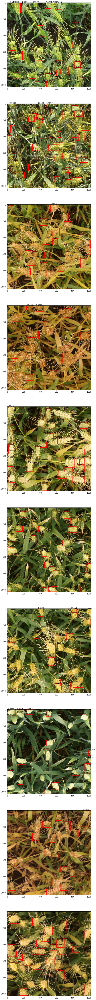

In [58]:
size = 10
len_img = len(test_df['image_id'])
fig,ax = plt.subplots(len_img ,figsize = (size,len_img*size))
for i,image_id in enumerate(test_df['image_id']):
  img =  read_img(f'{data_path}/test/{image_id}.jpg',1024)
  ax[i].imshow(img)
  boxes=test_df[test_df['image_id']==image_id]['PredictionString']
  boxes=str(boxes.values).replace('[','')
  boxes=boxes.replace(']','')
  boxes=boxes.replace('\'','')
  boxes = list(boxes.split(" "))
  #print(boxes)
  boxes = np.array(boxes).astype('float')
  boxes = boxes.reshape(-1,5)
  for box in boxes:
    x,y,w,h = box[1:]
    s = box[0]
    ax[i].text(x,y,str(s))
    rect = patches.Rectangle((x,y),w,h,linewidth=1,edgecolor='r',facecolor='none')
    ax[i].add_patch(rect)
plt.savefig(data_path+"/scratch_test_view.png",format='png')

In [1]:
size = 10
len_img = 2#len(test_df['image_id'])
fig,ax = plt.subplots(1,len_img ,figsize = (size,size))
for i,image_id in enumerate(test_df['image_id'][:len_img]):
  img =  read_img(f'{data_path}/test/{image_id}.jpg',1024)
  ax[i].imshow(img)
  boxes=test_df[test_df['image_id']==image_id]['PredictionString']
  boxes=str(boxes.values).replace('[','')
  boxes=boxes.replace(']','')
  boxes=boxes.replace('\'','')
  boxes = list(boxes.split(" "))
  #print(boxes)
  boxes = np.array(boxes).astype('float')
  boxes = boxes.reshape(-1,5)
  for box in boxes:
    x,y,w,h = box[1:]
    s = box[0]
    ax[i].text(x,y,str(s))
    rect = patches.Rectangle((x,y),w,h,linewidth=1,edgecolor='r',facecolor='none')
    ax[i].add_patch(rect)
  #break
plt.savefig(data_path+"/scratch_example_view.png",format='png')

NameError: name 'plt' is not defined